In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
df = pd.read_csv("csv/2021/schedules_2021.csv")

In [7]:
print(df)

             game_id  season game_type  week     gameday   weekday gametime  \
0     2021_01_DAL_TB    2021       REG     1  2021-09-09  Thursday    20:20   
1    2021_01_PHI_ATL    2021       REG     1  2021-09-12    Sunday    13:00   
2    2021_01_PIT_BUF    2021       REG     1  2021-09-12    Sunday    13:00   
3    2021_01_NYJ_CAR    2021       REG     1  2021-09-12    Sunday    13:00   
4    2021_01_MIN_CIN    2021       REG     1  2021-09-12    Sunday    13:00   
..               ...     ...       ...   ...         ...       ...      ...   
280    2021_20_LA_TB    2021       DIV    20  2022-01-23    Sunday    15:00   
281   2021_20_BUF_KC    2021       DIV    20  2022-01-23    Sunday    18:30   
282   2021_21_CIN_KC    2021       CON    21  2022-01-30    Sunday    15:00   
283    2021_21_SF_LA    2021       CON    21  2022-01-30    Sunday    18:30   
284   2021_22_LA_CIN    2021        SB    22  2022-02-13    Sunday    18:30   

    away_team  away_score home_team  ...  hits_allo

In [11]:
df = pd.read_csv("csv/2021/schedules_2021.csv", index_col='game_id')

In [12]:
print(df)

                 season game_type  week     gameday   weekday gametime  \
game_id                                                                  
2021_01_DAL_TB     2021       REG     1  2021-09-09  Thursday    20:20   
2021_01_PHI_ATL    2021       REG     1  2021-09-12    Sunday    13:00   
2021_01_PIT_BUF    2021       REG     1  2021-09-12    Sunday    13:00   
2021_01_NYJ_CAR    2021       REG     1  2021-09-12    Sunday    13:00   
2021_01_MIN_CIN    2021       REG     1  2021-09-12    Sunday    13:00   
...                 ...       ...   ...         ...       ...      ...   
2021_20_LA_TB      2021       DIV    20  2022-01-23    Sunday    15:00   
2021_20_BUF_KC     2021       DIV    20  2022-01-23    Sunday    18:30   
2021_21_CIN_KC     2021       CON    21  2022-01-30    Sunday    15:00   
2021_21_SF_LA      2021       CON    21  2022-01-30    Sunday    18:30   
2021_22_LA_CIN     2021        SB    22  2022-02-13    Sunday    18:30   

                away_team  away_score

In [13]:
df = df.drop(columns = ["gameday", "weekday", "gametime", "old_game_id", "gsis","nfl_detail_id", "pfr", "away_qb_id", "home_qb_id", "stadium_id", "stadium"])


In [14]:
print(df)

                 season game_type  week away_team  away_score home_team  \
game_id                                                                   
2021_01_DAL_TB     2021       REG     1       DAL          29        TB   
2021_01_PHI_ATL    2021       REG     1       PHI          32       ATL   
2021_01_PIT_BUF    2021       REG     1       PIT          23       BUF   
2021_01_NYJ_CAR    2021       REG     1       NYJ          14       CAR   
2021_01_MIN_CIN    2021       REG     1       MIN          24       CIN   
...                 ...       ...   ...       ...         ...       ...   
2021_20_LA_TB      2021       DIV    20        LA          30        TB   
2021_20_BUF_KC     2021       DIV    20       BUF          36        KC   
2021_21_CIN_KC     2021       CON    21       CIN          27        KC   
2021_21_SF_LA      2021       CON    21        SF          17        LA   
2021_22_LA_CIN     2021        SB    22        LA          23       CIN   

                 home_sc

In [15]:
df['div_game'] = df['div_game'].replace({0: "NO", 1: "YES"})

In [16]:
division_game = df[df["div_game"]== "YES"]

In [17]:
print(division_game)

                 season game_type  week away_team  away_score home_team  \
game_id                                                                   
2021_01_JAX_HOU    2021       REG     1       JAX          21       HOU   
2021_01_MIA_NE     2021       REG     1       MIA          17        NE   
2021_02_NYG_WAS    2021       REG     2       NYG          29       WAS   
2021_02_NO_CAR     2021       REG     2        NO           7       CAR   
2021_02_BUF_MIA    2021       REG     2       BUF          35       MIA   
...                 ...       ...   ...       ...         ...       ...   
2021_18_CAR_TB     2021       REG    18       CAR          17        TB   
2021_18_LAC_LV     2021       REG    18       LAC          32        LV   
2021_19_NE_BUF     2021        WC    19        NE          17       BUF   
2021_19_ARI_LA     2021        WC    19       ARI          11        LA   
2021_21_SF_LA      2021       CON    21        SF          17        LA   

                 home_sc

In [18]:
playoff_game_types = ['WC', 'DIV', 'CON', 'SB']

In [19]:
playoff_teams = set()
playoff_games = df[df['game_type'].isin(playoff_game_types)]
playoff_teams.update(playoff_games['home_team'].unique())
playoff_teams.update(playoff_games['away_team'].unique())

In [20]:
print(f"Teams that made playoffs: {sorted(playoff_teams)}")
print(f"Number of playoff teams: {len(playoff_teams)}")

Teams that made playoffs: ['ARI', 'BUF', 'CIN', 'DAL', 'GB', 'KC', 'LA', 'LV', 'NE', 'PHI', 'PIT', 'SF', 'TB', 'TEN']
Number of playoff teams: 14


In [21]:
df_filtered = df[
    (df['game_type'].isin(playoff_game_types)) |  # Keep all playoff games
    ((df['game_type'] == 'REG') & 
     ((df['home_team'].isin(playoff_teams)) | (df['away_team'].isin(playoff_teams))))  # Keep REG games with playoff teams
]

In [22]:
print(f"\nOriginal games: {len(df)}")
print(f"Filtered games: {len(df_filtered)}")
print(f"Games removed: {len(df) - len(df_filtered)}")


Original games: 285
Filtered games: 205
Games removed: 80


In [23]:
df = df_filtered

In [24]:
print(df)

                 season game_type  week away_team  away_score home_team  \
game_id                                                                   
2021_01_DAL_TB     2021       REG     1       DAL          29        TB   
2021_01_PHI_ATL    2021       REG     1       PHI          32       ATL   
2021_01_PIT_BUF    2021       REG     1       PIT          23       BUF   
2021_01_MIN_CIN    2021       REG     1       MIN          24       CIN   
2021_01_SF_DET     2021       REG     1        SF          41       DET   
...                 ...       ...   ...       ...         ...       ...   
2021_20_LA_TB      2021       DIV    20        LA          30        TB   
2021_20_BUF_KC     2021       DIV    20       BUF          36        KC   
2021_21_CIN_KC     2021       CON    21       CIN          27        KC   
2021_21_SF_LA      2021       CON    21        SF          17        LA   
2021_22_LA_CIN     2021        SB    22        LA          23       CIN   

                 home_sc

In [25]:
print(df.to_string())

                 season game_type  week away_team  away_score home_team  home_score location  result  total  overtime    pff       espn   ftn  away_rest  home_rest  away_moneyline  home_moneyline  spread_line  away_spread_odds  home_spread_odds  total_line  under_odds  over_odds div_game      roof     surface  temp  wind         away_qb_name        home_qb_name       away_coach       home_coach         referee  home_pass_rush_rating  home_sack_rate  qb_hit_rate.x  home_pressure_rate  home_pass_block_rating  home_sacks_allowed_rate  hits_allowed_rate.x  home_protection_rate  away_pass_rush_rating  away_sack_rate  qb_hit_rate.y  away_pressure_rate  away_pass_block_rating  away_sacks_allowed_rate  hits_allowed_rate.y  away_protection_rate
game_id                                                                                                                                                                                                                                                       

In [26]:
playoff_teams = ['TB', 'DAL', 'LA', 'GB', 'ARI', 'SF', 'PHI',  # NFC
                 'TEN', 'KC', 'BUF', 'CIN', 'LV', 'NE', 'PIT']  # AFC

In [27]:
df_playoff = df.copy()

In [28]:
away_stats = df_playoff.copy()
away_stats['team'] = away_stats['away_team']
away_stats['opponent'] = away_stats['home_team']
away_stats['points_scored'] = away_stats['away_score']
away_stats['points_allowed'] = away_stats['home_score']
away_stats['is_home'] = 0

In [29]:
away_stats = away_stats.rename(columns={
    'away_pass_rush_rating': 'pass_rush_rating',
    'away_sack_rate': 'sack_rate',
    'away_pressure_rate': 'pressure_rate',
    'away_pass_block_rating': 'pass_block_rating',
    'away_sacks_allowed_rate': 'sacks_allowed_rate',
    'away_protection_rate': 'protection_rate',
    'away_qb_name': 'qb_name',
    'away_coach': 'coach',
    'away_rest': 'rest_days',
    'away_moneyline': 'moneyline'
})

In [30]:
home_stats = df_playoff.copy()
home_stats['team'] = home_stats['home_team']
home_stats['opponent'] = home_stats['away_team']
home_stats['points_scored'] = home_stats['home_score']
home_stats['points_allowed'] = home_stats['away_score']
home_stats['is_home'] = 1

In [31]:
home_stats = home_stats.rename(columns={
    'home_pass_rush_rating': 'pass_rush_rating',
    'home_sack_rate': 'sack_rate',
    'home_pressure_rate': 'pressure_rate',
    'home_pass_block_rating': 'pass_block_rating',
    'home_sacks_allowed_rate': 'sacks_allowed_rate',
    'home_protection_rate': 'protection_rate',
    'home_qb_name': 'qb_name',
    'home_coach': 'coach',
    'home_rest': 'rest_days',
    'home_moneyline': 'moneyline'
})


In [32]:
cols_to_keep = ['team', 'opponent', 'points_scored', 'points_allowed', 
                'is_home', 'pass_rush_rating', 'sack_rate', 'pressure_rate',
                'pass_block_rating', 'sacks_allowed_rate', 'protection_rate',
                'qb_name', 'coach', 'rest_days', 'week', 'season']

combined_stats = pd.concat([
    away_stats[cols_to_keep],
    home_stats[cols_to_keep]
])

In [33]:
team_stats = combined_stats.groupby('team').agg({
    'points_scored': 'mean',
    'points_allowed': 'mean',
    'pass_rush_rating': 'mean',
    'sack_rate': 'mean',
    'pressure_rate': 'mean',
    'pass_block_rating': 'mean',
    'sacks_allowed_rate': 'mean',
    'protection_rate': 'mean',
    'is_home': 'sum',  # Total home games
    'week': 'count'  # Total games played
}).round(2)

In [34]:
team_stats = team_stats.rename(columns={
    'week': 'games_played',
    'is_home': 'home_games'
})


In [35]:
wins = combined_stats[combined_stats['points_scored'] > combined_stats['points_allowed']].groupby('team').size()
team_stats['wins'] = wins
team_stats['losses'] = team_stats['games_played'] - team_stats['wins']

In [36]:
team_stats['primary_qb'] = combined_stats.groupby('team')['qb_name'].agg(lambda x: x.mode()[0] if len(x.mode()) > 0 else x.iloc[0])
team_stats['coach'] = combined_stats.groupby('team')['coach'].agg(lambda x: x.mode()[0] if len(x.mode()) > 0 else x.iloc[0])


In [37]:
team_stats = team_stats.reset_index()

In [38]:
team_stats = team_stats[team_stats['team'].isin(playoff_teams)]


In [39]:
print(team_stats)

   team  points_scored  points_allowed  pass_rush_rating  sack_rate  \
0   ARI          25.56           22.22             10.46       0.06   
3   BUF          29.79           18.32              9.71       0.06   
6   CIN          26.29           21.81              9.66       0.06   
8   DAL          30.39           21.17             10.39       0.06   
11   GB          25.56           21.33              9.65       0.05   
15   KC          29.40           22.40              8.58       0.04   
16   LA          27.00           21.29              9.45       0.07   
18   LV          21.83           25.83             10.06       0.05   
21   NE          26.61           19.44              8.88       0.06   
25  PHI          25.50           23.11              7.88       0.04   
26  PIT          20.22           24.44             10.73       0.08   
28   SF          24.00           20.60             10.87       0.07   
29   TB          29.95           20.95             12.02       0.06   
30  TE

In [40]:
print(f"\nTotal playoff teams: {len(team_stats)}")


Total playoff teams: 14


In [41]:
team_stats["team"] = team_stats["team"].replace({"LA": "LAR"})

In [42]:
print(team_stats)

   team  points_scored  points_allowed  pass_rush_rating  sack_rate  \
0   ARI          25.56           22.22             10.46       0.06   
3   BUF          29.79           18.32              9.71       0.06   
6   CIN          26.29           21.81              9.66       0.06   
8   DAL          30.39           21.17             10.39       0.06   
11   GB          25.56           21.33              9.65       0.05   
15   KC          29.40           22.40              8.58       0.04   
16  LAR          27.00           21.29              9.45       0.07   
18   LV          21.83           25.83             10.06       0.05   
21   NE          26.61           19.44              8.88       0.06   
25  PHI          25.50           23.11              7.88       0.04   
26  PIT          20.22           24.44             10.73       0.08   
28   SF          24.00           20.60             10.87       0.07   
29   TB          29.95           20.95             12.02       0.06   
30  TE

In [43]:
df_epa_2021 = pd.read_csv("csv/2021/nfl_team_complete_2021.csv")

In [44]:
print(df_epa_2021)

   team  passing_epa  total_pass_plays  rushing_epa  total_rush_plays  \
0   TEN     0.093529               634    -0.052316               535   
1    KC     0.215187               803    -0.020674               372   
2   BUF     0.162983               774    -0.047153               401   
3   CIN     0.159071               668    -0.098545               416   
4    LV     0.084497               724    -0.161134               404   
5    NE     0.136366               611    -0.011368               473   
6   PIT    -0.037970               755    -0.077919               400   
7    GB     0.218177               679    -0.000583               414   
8    TB     0.195955               794     0.024251               367   
9   DAL     0.166281               761    -0.054208               445   
10   LA     0.183665               678    -0.089154               397   
11  ARI     0.149256               702    -0.036757               455   
12   SF     0.174027               594    -0.022154

In [45]:
df_epa_2021["team"] = df_epa_2021["team"].replace({"LA": "LAR"})

In [46]:
print(df_epa_2021)

   team  passing_epa  total_pass_plays  rushing_epa  total_rush_plays  \
0   TEN     0.093529               634    -0.052316               535   
1    KC     0.215187               803    -0.020674               372   
2   BUF     0.162983               774    -0.047153               401   
3   CIN     0.159071               668    -0.098545               416   
4    LV     0.084497               724    -0.161134               404   
5    NE     0.136366               611    -0.011368               473   
6   PIT    -0.037970               755    -0.077919               400   
7    GB     0.218177               679    -0.000583               414   
8    TB     0.195955               794     0.024251               367   
9   DAL     0.166281               761    -0.054208               445   
10  LAR     0.183665               678    -0.089154               397   
11  ARI     0.149256               702    -0.036757               455   
12   SF     0.174027               594    -0.022154

In [47]:
playoff_teams = ['TB', 'DAL', 'LAR', 'GB', 'ARI', 'SF', 'PHI',  # NFC
                 'TEN', 'KC', 'BUF', 'CIN', 'LV', 'NE', 'PIT']  # AFC

In [48]:
df_epa_2021 = df_epa_2021[(df_epa_2021['team'].isin(playoff_teams))]

In [49]:
print(df_epa_2021)

   team  passing_epa  total_pass_plays  rushing_epa  total_rush_plays  \
0   TEN     0.093529               634    -0.052316               535   
1    KC     0.215187               803    -0.020674               372   
2   BUF     0.162983               774    -0.047153               401   
3   CIN     0.159071               668    -0.098545               416   
4    LV     0.084497               724    -0.161134               404   
5    NE     0.136366               611    -0.011368               473   
6   PIT    -0.037970               755    -0.077919               400   
7    GB     0.218177               679    -0.000583               414   
8    TB     0.195955               794     0.024251               367   
9   DAL     0.166281               761    -0.054208               445   
10  LAR     0.183665               678    -0.089154               397   
11  ARI     0.149256               702    -0.036757               455   
12   SF     0.174027               594    -0.022154

In [50]:
print(team_stats)

   team  points_scored  points_allowed  pass_rush_rating  sack_rate  \
0   ARI          25.56           22.22             10.46       0.06   
3   BUF          29.79           18.32              9.71       0.06   
6   CIN          26.29           21.81              9.66       0.06   
8   DAL          30.39           21.17             10.39       0.06   
11   GB          25.56           21.33              9.65       0.05   
15   KC          29.40           22.40              8.58       0.04   
16  LAR          27.00           21.29              9.45       0.07   
18   LV          21.83           25.83             10.06       0.05   
21   NE          26.61           19.44              8.88       0.06   
25  PHI          25.50           23.11              7.88       0.04   
26  PIT          20.22           24.44             10.73       0.08   
28   SF          24.00           20.60             10.87       0.07   
29   TB          29.95           20.95             12.02       0.06   
30  TE

In [51]:
team_stats.merge(df_epa_2021)

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,total_offensive_epa,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,ties,win_pct,made_playoffs,conference,playoff_seed


In [52]:
print(team_stats.columns)
print(df_epa_2021.columns)


Index(['team', 'points_scored', 'points_allowed', 'pass_rush_rating',
       'sack_rate', 'pressure_rate', 'pass_block_rating', 'sacks_allowed_rate',
       'protection_rate', 'home_games', 'games_played', 'wins', 'losses',
       'primary_qb', 'coach'],
      dtype='object')
Index(['team', 'passing_epa', 'total_pass_plays', 'rushing_epa',
       'total_rush_plays', 'total_offensive_epa', 'total_plays',
       'defensive_epa', 'defensive_pass_epa', 'defensive_rush_epa', 'wins',
       'losses', 'ties', 'win_pct', 'made_playoffs', 'conference',
       'playoff_seed'],
      dtype='object')


In [53]:
print(team_stats.dtypes)
print(df_epa_2021.dtypes)

team                   object
points_scored         float64
points_allowed        float64
pass_rush_rating      float64
sack_rate             float64
pressure_rate         float64
pass_block_rating     float64
sacks_allowed_rate    float64
protection_rate       float64
home_games              int64
games_played            int64
wins                  float64
losses                float64
primary_qb             object
coach                  object
dtype: object
team                    object
passing_epa            float64
total_pass_plays         int64
rushing_epa            float64
total_rush_plays         int64
total_offensive_epa    float64
total_plays              int64
defensive_epa          float64
defensive_pass_epa     float64
defensive_rush_epa     float64
wins                     int64
losses                   int64
ties                     int64
win_pct                float64
made_playoffs           object
conference              object
playoff_seed           float64
dtype: ob

In [54]:
print(team_stats.head())
print(df_epa_2021.head())

   team  points_scored  points_allowed  pass_rush_rating  sack_rate  \
0   ARI          25.56           22.22             10.46       0.06   
3   BUF          29.79           18.32              9.71       0.06   
6   CIN          26.29           21.81              9.66       0.06   
8   DAL          30.39           21.17             10.39       0.06   
11   GB          25.56           21.33              9.65       0.05   

    pressure_rate  pass_block_rating  sacks_allowed_rate  protection_rate  \
0            0.21              93.00                0.06             0.86   
3            0.20              91.71                0.03             0.85   
6            0.18              88.18                0.08             0.76   
8            0.20              92.44                0.04             0.85   
11           0.18              91.48                0.05             0.83   

    home_games  games_played  wins  losses     primary_qb            coach  
0            8            18  11.

In [182]:
NFL_2021_team_stats = team_stats.merge(df_epa_2021, on='team', how='left').set_index("playoff_seed").sort_values('playoff_seed')

In [181]:
NFL_2021_team_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
1.0,GB,25.56,21.33,9.65,0.05,0.18,91.48,0.05,0.83,9,...,1384,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,NO
1.0,TEN,24.17,20.72,9.76,0.06,0.18,89.05,0.07,0.75,10,...,1470,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,NO
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,1459,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,NO
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,1467,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,NO
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,1457,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,NO
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,1521,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,NO
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,1383,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,NO
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,1361,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,YES
5.0,ARI,25.56,22.22,10.46,0.06,0.21,93.00,0.06,0.86,8,...,1454,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,NO


In [57]:
NFL_2021_team_stats["superbowl_win"] = [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]

In [58]:
NFL_2021_team_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,made_playoffs,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
1.0,GB,25.56,21.33,9.65,0.05,0.18,91.48,0.05,0.83,9,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,Yes,NFC,0
1.0,TEN,24.17,20.72,9.76,0.06,0.18,89.05,0.07,0.75,10,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,Yes,AFC,0
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,Yes,AFC,0
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,Yes,NFC,0
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,Yes,AFC,0
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,Yes,NFC,0
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,Yes,AFC,0
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,Yes,NFC,1
5.0,ARI,25.56,22.22,10.46,0.06,0.21,93.00,0.06,0.86,8,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,Yes,NFC,0


In [60]:
NFL_2021_team_stats["superbowl_win"] = NFL_2021_team_stats["superbowl_win"].replace({0: "NO", 1: "YES"})

In [61]:
NFL_2021_team_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,made_playoffs,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
1.0,GB,25.56,21.33,9.65,0.05,0.18,91.48,0.05,0.83,9,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,Yes,NFC,NO
1.0,TEN,24.17,20.72,9.76,0.06,0.18,89.05,0.07,0.75,10,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,Yes,AFC,NO
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,Yes,AFC,NO
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,Yes,NFC,NO
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,Yes,AFC,NO
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,Yes,NFC,NO
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,Yes,AFC,NO
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,Yes,NFC,YES
5.0,ARI,25.56,22.22,10.46,0.06,0.21,93.00,0.06,0.86,8,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,Yes,NFC,NO


In [62]:
NFL_2021_team_stats = NFL_2021_team_stats.drop(columns = ["made_playoffs"])

In [63]:
NFL_2021_team_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
1.0,GB,25.56,21.33,9.65,0.05,0.18,91.48,0.05,0.83,9,...,1384,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,NO
1.0,TEN,24.17,20.72,9.76,0.06,0.18,89.05,0.07,0.75,10,...,1470,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,NO
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,1459,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,NO
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,1467,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,NO
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,1457,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,NO
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,1521,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,NO
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,1383,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,NO
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,1361,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,YES
5.0,ARI,25.56,22.22,10.46,0.06,0.21,93.00,0.06,0.86,8,...,1454,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,NO


In [64]:
NFL_2021_team_stats['points_scored'].mean()

np.float64(26.162142857142857)

In [65]:
teams_score_more_than_avg = NFL_2021_team_stats[NFL_2021_team_stats['points_scored'] >= 26]

In [66]:
teams_score_more_than_avg

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,1459,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,NO
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,1467,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,NO
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,1457,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,NO
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,1521,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,NO
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,1383,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,NO
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,1361,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,YES
6.0,NE,26.61,19.44,8.88,0.06,0.19,92.19,0.05,0.83,9,...,1374,-0.090059,-0.053937,-0.082298,10,7,0,0.588235,AFC,NO


In [67]:
df_playoff


,season,game_type,week,away_team,away_score,home_team,home_score,location,result,total,...,hits_allowed_rate.x,home_protection_rate,away_pass_rush_rating,away_sack_rate,qb_hit_rate.y,away_pressure_rate,away_pass_block_rating,away_sacks_allowed_rate,hits_allowed_rate.y,away_protection_rate
game_id,,,,,,,,,,,,,,,,,,,,,
2021_01_DAL_TB,2021,REG,1,DAL,29,TB,31,Home,2,60,...,0.071788,0.899244,10.390516,0.055935,0.147340,0.203274,92.441472,0.043364,0.105125,0.851511
2021_01_PHI_ATL,2021,REG,1,PHI,32,ATL,6,Home,-26,38,...,0.193985,0.745865,7.881417,0.042773,0.117994,0.160767,92.982456,0.050571,0.106036,0.843393
2021_01_PIT_BUF,2021,REG,1,PIT,23,BUF,16,Home,-7,39,...,0.117571,0.847545,10.729023,0.080058,0.147016,0.227074,92.216817,0.050331,0.098013,0.851656
2021_01_MIN_CIN,2021,REG,1,MIN,24,CIN,27,Home,3,51,...,0.157186,0.760479,10.197145,0.067639,0.131300,0.198939,91.159830,0.043924,0.139092,0.816984
2021_01_SF_DET,2021,REG,1,SF,41,DET,33,Home,-8,74,...,0.137778,0.808889,10.871184,0.071535,0.146051,0.217586,91.754123,0.055556,0.129630,0.814815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021_20_LA_TB,2021,DIV,20,LA,30,TB,27,Home,-3,57,...,0.071788,0.899244,9.447166,0.068587,0.116598,0.185185,92.111195,0.045723,0.109145,0.845133
2021_20_BUF_KC,2021,DIV,20,BUF,36,KC,42,Home,6,78,...,0.108344,0.856787,9.706546,0.063733,0.132018,0.195751,91.713483,0.034884,0.117571,0.847545
2021_21_CIN_KC,2021,CON,21,CIN,27,KC,24,Home,-3,51,...,0.108344,0.856787,9.656652,0.057299,0.126876,0.184175,88.183161,0.082335,0.157186,0.760479


In [68]:
la = df_playoff[(df_playoff['home_team'] == 'LA') | (df_playoff['away_team'] == 'LA')].copy()

In [69]:
la['la_points'] = la.apply(lambda row: row['home_score'] if row['home_team'] == 'LA' else row['away_score'], axis=1)

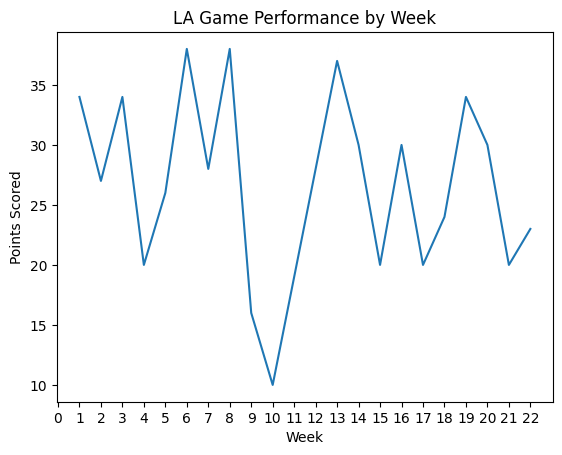

In [70]:
plt.plot(la['week'], la['la_points'])
plt.xticks(range(0, int(la['week'].max()) + 1, 1)) 
plt.xlabel('Week')
plt.ylabel('Points Scored')
plt.title('LA Game Performance by Week')
plt.show()

In [71]:
NFL_2021_team_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,superbowl_win
playoff_seed,,,,,,,,,,,,,,,,,,,,,
1.0,GB,25.56,21.33,9.65,0.05,0.18,91.48,0.05,0.83,9,...,1384,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,NO
1.0,TEN,24.17,20.72,9.76,0.06,0.18,89.05,0.07,0.75,10,...,1470,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,NO
2.0,KC,29.40,22.40,8.58,0.04,0.16,91.95,0.03,0.86,12,...,1459,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,NO
2.0,TB,29.95,20.95,12.02,0.06,0.21,94.44,0.03,0.90,10,...,1467,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,NO
3.0,BUF,29.79,18.32,9.71,0.06,0.20,91.71,0.03,0.85,10,...,1457,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,NO
3.0,DAL,30.39,21.17,10.39,0.06,0.20,92.44,0.04,0.85,9,...,1521,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,NO
4.0,CIN,26.29,21.81,9.66,0.06,0.18,88.18,0.08,0.76,11,...,1383,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,NO
4.0,LAR,27.00,21.29,9.45,0.07,0.19,92.11,0.05,0.85,10,...,1361,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,YES
5.0,ARI,25.56,22.22,10.46,0.06,0.21,93.00,0.06,0.86,8,...,1454,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,NO


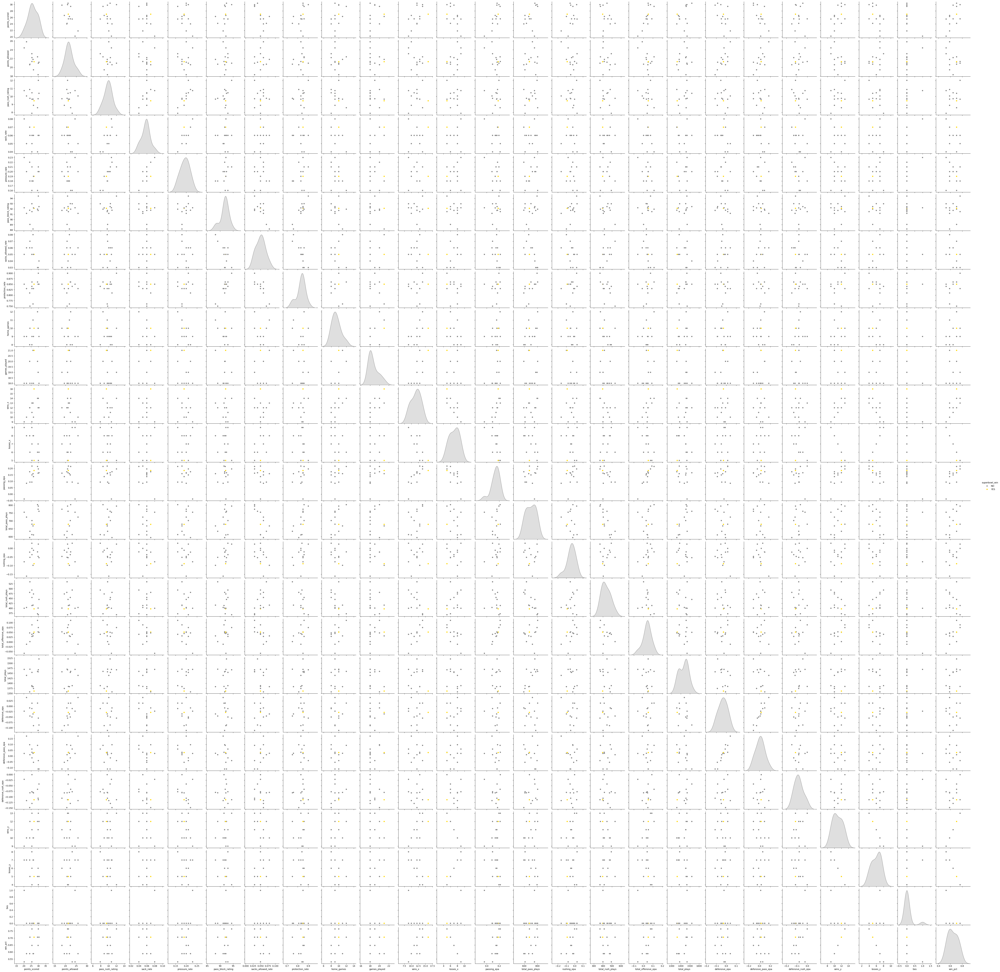

In [82]:
pairplot = sns.pairplot(NFL_2021_team_stats, hue='superbowl_win', palette={'YES': 'gold', 'NO': 'gray'})
pairplot.savefig('my_pairplot.png', dpi=300, bbox_inches='tight')

In [83]:
pairplot.savefig('my_pairplot.png', dpi=300, bbox_inches='tight')

In [84]:
df_playoff_teams = df.copy()

In [85]:
df_playoff_teams

,season,game_type,week,away_team,away_score,home_team,home_score,location,result,total,...,hits_allowed_rate.x,home_protection_rate,away_pass_rush_rating,away_sack_rate,qb_hit_rate.y,away_pressure_rate,away_pass_block_rating,away_sacks_allowed_rate,hits_allowed_rate.y,away_protection_rate
game_id,,,,,,,,,,,,,,,,,,,,,
2021_01_DAL_TB,2021,REG,1,DAL,29,TB,31,Home,2,60,...,0.071788,0.899244,10.390516,0.055935,0.147340,0.203274,92.441472,0.043364,0.105125,0.851511
2021_01_PHI_ATL,2021,REG,1,PHI,32,ATL,6,Home,-26,38,...,0.193985,0.745865,7.881417,0.042773,0.117994,0.160767,92.982456,0.050571,0.106036,0.843393
2021_01_PIT_BUF,2021,REG,1,PIT,23,BUF,16,Home,-7,39,...,0.117571,0.847545,10.729023,0.080058,0.147016,0.227074,92.216817,0.050331,0.098013,0.851656
2021_01_MIN_CIN,2021,REG,1,MIN,24,CIN,27,Home,3,51,...,0.157186,0.760479,10.197145,0.067639,0.131300,0.198939,91.159830,0.043924,0.139092,0.816984
2021_01_SF_DET,2021,REG,1,SF,41,DET,33,Home,-8,74,...,0.137778,0.808889,10.871184,0.071535,0.146051,0.217586,91.754123,0.055556,0.129630,0.814815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021_20_LA_TB,2021,DIV,20,LA,30,TB,27,Home,-3,57,...,0.071788,0.899244,9.447166,0.068587,0.116598,0.185185,92.111195,0.045723,0.109145,0.845133
2021_20_BUF_KC,2021,DIV,20,BUF,36,KC,42,Home,6,78,...,0.108344,0.856787,9.706546,0.063733,0.132018,0.195751,91.713483,0.034884,0.117571,0.847545
2021_21_CIN_KC,2021,CON,21,CIN,27,KC,24,Home,-3,51,...,0.108344,0.856787,9.656652,0.057299,0.126876,0.184175,88.183161,0.082335,0.157186,0.760479


In [89]:
df_playoff_teams = df_playoff_teams[df_playoff_teams['game_type'] != 'WC']
df_playoff_teams = df_playoff_teams[df_playoff_teams['game_type'] != 'DIV']
df_playoff_teams = df_playoff_teams[df_playoff_teams['game_type'] != 'CON']
df_playoff_teams = df_playoff_teams[df_playoff_teams['game_type'] != 'SB']

In [90]:
df_playoff_teams

,season,game_type,week,away_team,away_score,home_team,home_score,location,result,total,...,hits_allowed_rate.x,home_protection_rate,away_pass_rush_rating,away_sack_rate,qb_hit_rate.y,away_pressure_rate,away_pass_block_rating,away_sacks_allowed_rate,hits_allowed_rate.y,away_protection_rate
game_id,,,,,,,,,,,,,,,,,,,,,
2021_01_DAL_TB,2021,REG,1,DAL,29,TB,31,Home,2,60,...,0.071788,0.899244,10.390516,0.055935,0.147340,0.203274,92.441472,0.043364,0.105125,0.851511
2021_01_PHI_ATL,2021,REG,1,PHI,32,ATL,6,Home,-26,38,...,0.193985,0.745865,7.881417,0.042773,0.117994,0.160767,92.982456,0.050571,0.106036,0.843393
2021_01_PIT_BUF,2021,REG,1,PIT,23,BUF,16,Home,-7,39,...,0.117571,0.847545,10.729023,0.080058,0.147016,0.227074,92.216817,0.050331,0.098013,0.851656
2021_01_MIN_CIN,2021,REG,1,MIN,24,CIN,27,Home,3,51,...,0.157186,0.760479,10.197145,0.067639,0.131300,0.198939,91.159830,0.043924,0.139092,0.816984
2021_01_SF_DET,2021,REG,1,SF,41,DET,33,Home,-8,74,...,0.137778,0.808889,10.871184,0.071535,0.146051,0.217586,91.754123,0.055556,0.129630,0.814815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021_18_NYJ_BUF,2021,REG,18,NYJ,10,BUF,27,Home,17,37,...,0.117571,0.847545,8.108108,0.048529,0.123529,0.172059,88.682055,0.074334,0.138850,0.786816
2021_18_SF_LA,2021,REG,18,SF,27,LA,24,Home,-3,51,...,0.109145,0.845133,10.871184,0.071535,0.146051,0.217586,91.754123,0.055556,0.129630,0.814815
2021_18_NE_MIA,2021,REG,18,NE,24,MIA,33,Home,9,57,...,0.114286,0.831293,8.878856,0.056962,0.129747,0.186709,92.193309,0.045827,0.126023,0.828151


In [223]:
playoff_teams = ['TB', 'DAL', 'LA', 'GB', 'ARI', 'SF', 'PHI',  # NFC
                 'TEN', 'KC', 'BUF', 'CIN', 'LV', 'NE', 'PIT']  # AFC

# First, create away_stats and home_stats as you have them
away_stats = df_playoff_teams.copy()
away_stats['team'] = away_stats['away_team']
away_stats['opponent'] = away_stats['home_team']
away_stats['points_scored'] = away_stats['away_score']
away_stats['points_allowed'] = away_stats['home_score']
away_stats['is_home'] = 0
away_stats = away_stats.rename(columns={
    'away_pass_rush_rating': 'pass_rush_rating',
    'away_sack_rate': 'sack_rate',
    'away_pressure_rate': 'pressure_rate',
    'away_pass_block_rating': 'pass_block_rating',
    'away_sacks_allowed_rate': 'sacks_allowed_rate',
    'away_protection_rate': 'protection_rate',
    'away_qb_name': 'qb_name',
    'away_coach': 'coach',
    'away_rest': 'rest_days',
    'away_moneyline': 'moneyline'
})

home_stats = df_playoff_teams.copy()
home_stats['team'] = home_stats['home_team']
home_stats['opponent'] = home_stats['away_team']
home_stats['points_scored'] = home_stats['home_score']
home_stats['points_allowed'] = home_stats['away_score']
home_stats['is_home'] = 1
home_stats = home_stats.rename(columns={
    'home_pass_rush_rating': 'pass_rush_rating',
    'home_sack_rate': 'sack_rate',
    'home_pressure_rate': 'pressure_rate',
    'home_pass_block_rating': 'pass_block_rating',
    'home_sacks_allowed_rate': 'sacks_allowed_rate',
    'home_protection_rate': 'protection_rate',
    'home_qb_name': 'qb_name',
    'home_coach': 'coach',
    'home_rest': 'rest_days',
    'home_moneyline': 'moneyline'
})

cols_to_keep = ['team', 'opponent', 'points_scored', 'points_allowed', 
                'is_home', 'pass_rush_rating', 'sack_rate', 'pressure_rate',
                'pass_block_rating', 'sacks_allowed_rate', 'protection_rate',
                'qb_name', 'coach', 'rest_days', 'week', 'season']

combined_stats = pd.concat([
    away_stats[cols_to_keep],
    home_stats[cols_to_keep]
])

# ADD THIS: Calculate last 5 games win percentage (weeks 14-18)
last_5_games = combined_stats[combined_stats['week'].between(14, 18)].copy()
last_5_games['won'] = (last_5_games['points_scored'] > last_5_games['points_allowed']).astype(int)
last_5_win_pct = last_5_games.groupby('team').agg({
    'won': 'sum'
}).rename(columns={'won': 'last_5_wins'})
last_5_win_pct['last_5_win_pct'] = (last_5_win_pct['last_5_wins'] / 5).round(3)

# Continue with your existing aggregation
team_stats_playoffs = combined_stats.groupby('team').agg({
    'points_scored': 'sum',
    'points_allowed': 'sum',
    'pass_rush_rating': 'mean',
    'sack_rate': 'mean',
    'pressure_rate': 'mean',
    'pass_block_rating': 'mean',
    'sacks_allowed_rate': 'mean',
    'protection_rate': 'mean',
    'is_home': 'sum',
    'week': 'count'
}).round(2)

team_stats_playoffs = team_stats_playoffs.rename(columns={
    'week': 'games_played',
    'is_home': 'home_games'
})

wins = combined_stats[combined_stats['points_scored'] > combined_stats['points_allowed']].groupby('team').size()
team_stats_playoffs['wins'] = wins
team_stats_playoffs['losses'] = team_stats_playoffs['games_played'] - team_stats_playoffs['wins']
team_stats_playoffs['primary_qb'] = combined_stats.groupby('team')['qb_name'].agg(lambda x: x.mode()[0] if len(x.mode()) > 0 else x.iloc[0])
team_stats_playoffs['coach'] = combined_stats.groupby('team')['coach'].agg(lambda x: x.mode()[0] if len(x.mode()) > 0 else x.iloc[0])

# ADD THIS: Merge the last 5 games win percentage
team_stats_playoffs = team_stats_playoffs.merge(last_5_win_pct[['last_5_win_pct']], left_index=True, right_index=True, how='left')

team_stats_playoffs = team_stats_playoffs.reset_index()
team_stats_playoffs = team_stats_playoffs[team_stats_playoffs['team'].isin(playoff_teams)]

In [224]:
team_stats_playoffs

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,games_played,wins,losses,primary_qb,coach,last_5_win_pct
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,8,17,11.0,6.0,Kyler Murray,Kliff Kingsbury,0.2
3,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,9,17,11.0,6.0,Josh Allen,Sean McDermott,0.8
6,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,9,17,10.0,7.0,Joe Burrow,Zac Taylor,0.6
8,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,8,17,12.0,5.0,Dak Prescott,Mike McCarthy,0.8
11,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,8,17,13.0,4.0,Aaron Rodgers,Matt LaFleur,0.8
15,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,9,17,12.0,5.0,Patrick Mahomes,Andy Reid,0.8
16,LA,460,372,9.45,0.07,0.19,92.11,0.05,0.85,8,17,12.0,5.0,Matthew Stafford,Sean McVay,0.8
18,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,9,17,10.0,7.0,Derek Carr,Rich Bisaccia,0.8
21,NE,462,303,8.88,0.06,0.19,92.19,0.05,0.83,9,17,10.0,7.0,Mac Jones,Bill Belichick,0.2
25,PHI,444,385,7.88,0.04,0.16,92.98,0.05,0.84,8,17,9.0,8.0,Jalen Hurts,Nick Sirianni,0.6


In [225]:
team_stats_playoffs["team"] = team_stats_playoffs["team"].replace({"LA": "LAR"})

In [226]:
team_stats_playoffs

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,games_played,wins,losses,primary_qb,coach,last_5_win_pct
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,8,17,11.0,6.0,Kyler Murray,Kliff Kingsbury,0.2
3,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,9,17,11.0,6.0,Josh Allen,Sean McDermott,0.8
6,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,9,17,10.0,7.0,Joe Burrow,Zac Taylor,0.6
8,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,8,17,12.0,5.0,Dak Prescott,Mike McCarthy,0.8
11,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,8,17,13.0,4.0,Aaron Rodgers,Matt LaFleur,0.8
15,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,9,17,12.0,5.0,Patrick Mahomes,Andy Reid,0.8
16,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,8,17,12.0,5.0,Matthew Stafford,Sean McVay,0.8
18,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,9,17,10.0,7.0,Derek Carr,Rich Bisaccia,0.8
21,NE,462,303,8.88,0.06,0.19,92.19,0.05,0.83,9,17,10.0,7.0,Mac Jones,Bill Belichick,0.2
25,PHI,444,385,7.88,0.04,0.16,92.98,0.05,0.84,8,17,9.0,8.0,Jalen Hurts,Nick Sirianni,0.6


In [227]:
NFL_2021_team_REG_stats['season'] = 2021


In [228]:
NFL_2021_team_REG_stats = team_stats_playoffs.merge(df_epa_2021, on='team', how='left').sort_values(['playoff_seed'])

In [229]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,home_games,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,made_playoffs,conference,playoff_seed
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,8,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,Yes,NFC,1.0
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,9,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,Yes,AFC,1.0
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,9,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,Yes,AFC,2.0
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,8,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,Yes,NFC,2.0
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,9,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,Yes,AFC,3.0
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,8,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,Yes,NFC,3.0
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,9,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,Yes,AFC,4.0
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,8,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,Yes,NFC,4.0
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,8,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,Yes,NFC,5.0
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,9,...,0.040506,0.171855,-0.116968,10,7,0,0.588235,Yes,AFC,5.0


In [230]:
NFL_2021_team_REG_stats = NFL_2021_team_REG_stats.drop(columns = ["made_playoffs", "home_games", "games_played"])

In [231]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins_x,...,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,playoff_seed
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,13.0,...,1384,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,12.0,...,1470,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,12.0,...,1459,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,13.0,...,1467,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,11.0,...,1457,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,12.0,...,1521,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,10.0,...,1383,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,12.0,...,1361,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,11.0,...,1454,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,10.0,...,1439,0.040506,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0


In [232]:
NFL_2021_team_REG_stats["superbowl_win"] = [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]

In [233]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins_x,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,playoff_seed,superbowl_win
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,13.0,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,0
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,12.0,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,0
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,12.0,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,0
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,13.0,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,0
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,11.0,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,0
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,12.0,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,0
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,10.0,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,0
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,12.0,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,1
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,11.0,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,0
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,10.0,...,0.040506,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,0


In [234]:
NFL_2021_team_REG_stats["superbowl_win"] = NFL_2021_team_REG_stats["superbowl_win"].replace({0: "NO", 1: "YES"})

In [235]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins_x,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,playoff_seed,superbowl_win
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,13.0,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,NO
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,12.0,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,NO
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,12.0,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,NO
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,13.0,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,NO
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,11.0,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,NO
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,12.0,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,NO
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,10.0,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,NO
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,12.0,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,YES
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,11.0,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,NO
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,10.0,...,0.040506,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,NO


In [125]:
sns.pairplot(NFL_2021_team_REG_stats, hue='superbowl_win', palette={'YES': 'gold', 'NO': 'gray'}, height=4)

In [126]:
NFL_2021_team_REG_stats.to_string()

'             team  points_scored  points_allowed  pass_rush_rating  sack_rate  pressure_rate  pass_block_rating  sacks_allowed_rate  protection_rate  wins_x  losses_x          primary_qb            coach  last_5_win_pct  passing_epa  total_pass_plays  rushing_epa  total_rush_plays  total_offensive_epa  total_plays  defensive_epa  defensive_pass_epa  defensive_rush_epa  wins_y  losses_y  ties   win_pct conference superbowl_win\nplayoff_seed                                                                                                                                                                                                                                                                                                                                                                                                                                 \n1.0            GB          26.47           21.82              9.65       0.05           0.18              91.48                0.05      

In [155]:
df = pd.read_csv("csv/nfl_playoff_teams_2022_2024.csv")

In [156]:
afc_teams = ['BUF', 'MIA', 'NE', 'NYJ', 'BAL', 'CIN', 'CLE', 'PIT', 
             'HOU', 'IND', 'JAX', 'TEN', 'DEN', 'KC', 'LV', 'LAC']
nfc_teams = ['DAL', 'NYG', 'PHI', 'WAS', 'CHI', 'DET', 'GB', 'MIN', 
             'ATL', 'CAR', 'NO', 'TB', 'ARI', 'LA', 'SF', 'SEA']

In [157]:
df['conference'] = df['team'].apply(lambda x: 'AFC' if x in afc_teams else 'NFC')

In [158]:
playoff_seeds = {
    2022: {
        'KC': 1, 'BUF': 2, 'CIN': 3, 'JAX': 4, 'LAC': 5, 'BAL': 6, 'MIA': 7,  # AFC
        'PHI': 1, 'SF': 2, 'MIN': 3, 'TB': 4, 'DAL': 5, 'NYG': 6, 'SEA': 7    # NFC
    },
    2023: {
        'BAL': 1, 'BUF': 2, 'KC': 3, 'HOU': 4, 'CLE': 5, 'MIA': 6, 'PIT': 7,  # AFC
        'SF': 1, 'DAL': 2, 'DET': 3, 'TB': 4, 'PHI': 5, 'LA': 6, 'GB': 7      # NFC
    },
    2024: {
        'KC': 1, 'BUF': 2, 'BAL': 3, 'HOU': 4, 'LAC': 5, 'PIT': 6, 'DEN': 7,  # AFC
        'DET': 1, 'PHI': 2, 'TB': 3, 'LA': 4, 'MIN': 5, 'WAS': 6, 'GB': 7     # NFC
    }
}

df['playoff_seed'] = df.apply(lambda row: playoff_seeds.get(row['season'], {}).get(row['team'], None), axis=1)

# 3. Add Super Bowl Winners
superbowl_winners = {
    2022: 'KC',   # Super Bowl LVII (Chiefs beat Eagles)
    2023: 'KC',   # Super Bowl LVIII (Chiefs beat 49ers)
    2024: 'PHI'    # Super Bowl LIX (Eagles beat Chiefs)
}
df['superbowl_win'] = df.apply(lambda row: 'Yes' if superbowl_winners.get(row['season']) == row['team'] else 'No', axis=1)

In [159]:
df

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins,...,total_rush_plays,total_offensive_epa,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,season,conference,playoff_seed,superbowl_win
0,BAL,350,315,10.262172,0.068279,0.194879,92.813918,0.064189,0.839527,10,...,478,0.011257,1361,-0.030290,0.054397,-0.108909,2022,AFC,6,No
1,BUF,455,286,10.302091,0.058394,0.194161,91.692308,0.047550,0.844380,13,...,365,0.089667,1333,-0.058677,-0.008849,-0.117377,2022,AFC,2,No
2,CIN,418,322,10.007819,0.047544,0.202853,90.291262,0.060606,0.820937,12,...,355,0.040710,1371,-0.046936,-0.024878,-0.074872,2022,AFC,3,No
3,DAL,467,342,11.398601,0.081694,0.246596,92.443503,0.042722,0.830696,12,...,516,0.016727,1444,-0.084516,-0.061811,-0.127738,2022,NFC,5,No
4,JAX,404,350,10.179211,0.049088,0.199158,93.328446,0.041116,0.866373,9,...,427,0.029183,1389,-0.021300,0.040572,-0.114224,2022,AFC,4,No
5,KC,496,369,11.937098,0.072464,0.220026,91.907514,0.033854,0.854167,14,...,368,0.122040,1411,0.009263,0.035867,-0.078794,2022,AFC,1,Yes
6,LAC,391,384,9.062742,0.066116,0.193388,89.821183,0.048811,0.814768,10,...,374,-0.018388,1483,-0.018015,-0.005768,0.038176,2022,AFC,5,No
7,MIA,397,399,9.540890,0.054348,0.180707,90.076336,0.052083,0.806548,9,...,369,0.019337,1327,0.011579,0.090521,-0.108902,2022,AFC,7,No
8,MIN,424,427,8.674189,0.052414,0.169655,87.628161,0.060802,0.765847,13,...,384,-0.015494,1487,0.001935,0.051380,-0.076969,2022,NFC,3,No
9,NYG,365,371,10.359712,0.061194,0.214925,88.477952,0.073353,0.757485,9,...,451,0.023793,1429,0.037667,0.048167,0.045666,2022,NFC,6,No


In [160]:
def add_last_5_win_pct(df):
    last_5_results = []
    
    for _, row in df.iterrows():
        team = row['team']
        season = row['season']
        
        # Load that season's schedule with correct path
        schedules = pd.read_csv(f'csv/{season}/schedules_{season}.csv')
        schedules = schedules[schedules['game_type'] == 'REG'].sort_values('week')
        
        # Get team's games
        team_games = schedules[
            (schedules['home_team'] == team) | (schedules['away_team'] == team)
        ].copy()
        
        # Calculate wins
        team_games['win'] = team_games.apply(lambda g: 
            1 if (g['home_team'] == team and g['home_score'] > g['away_score']) or
                 (g['away_team'] == team and g['away_score'] > g['home_score'])
            else 0, axis=1
        )
        
        # Get last 5 games win percentage
        last_5_pct = team_games.tail(5)['win'].mean()
        last_5_results.append(last_5_pct)
    
    df['last_5_win_pct'] = last_5_results
    return df

df = add_last_5_win_pct(df)
df.to_csv('nfl_playoff_teams_2022_2024_complete.csv', index=False)

In [165]:
NFL_2021_to_2024_reg_stats = df 

In [169]:
NFL_2021_to_2024_reg_stats.sort_values(['season', 'playoff_seed'])

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins,...,total_offensive_epa,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,season,conference,playoff_seed,superbowl_win,last_5_win_pct
5,KC,496,369,11.937098,0.072464,0.220026,91.907514,0.033854,0.854167,14,...,0.122040,1411,0.009263,0.035867,-0.078794,2022,AFC,1,Yes,1.0
10,PHI,477,344,13.483965,0.102041,0.269679,92.443503,0.066869,0.837386,14,...,0.056443,1455,-0.051375,-0.088321,-0.022835,2022,NFC,1,No,0.6
1,BUF,455,286,10.302091,0.058394,0.194161,91.692308,0.047550,0.844380,13,...,0.089667,1333,-0.058677,-0.008849,-0.117377,2022,AFC,2,No,1.0
12,SF,450,277,12.224753,0.062857,0.230000,92.290419,0.052453,0.825719,13,...,0.039366,1363,-0.113561,-0.083023,-0.176054,2022,NFC,2,No,1.0
2,CIN,418,322,10.007819,0.047544,0.202853,90.291262,0.060606,0.820937,12,...,0.040710,1371,-0.046936,-0.024878,-0.074872,2022,AFC,3,No,1.0
8,MIN,424,427,8.674189,0.052414,0.169655,87.628161,0.060802,0.765847,13,...,-0.015494,1487,0.001935,0.051380,-0.076969,2022,NFC,3,No,0.6
4,JAX,404,350,10.179211,0.049088,0.199158,93.328446,0.041116,0.866373,9,...,0.029183,1389,-0.021300,0.040572,-0.114224,2022,AFC,4,No,1.0
13,TB,313,358,10.499638,0.066865,0.215453,93.224932,0.026797,0.878197,8,...,-0.055674,1499,-0.018629,0.013246,-0.085916,2022,NFC,4,No,0.4
3,DAL,467,342,11.398601,0.081694,0.246596,92.443503,0.042722,0.830696,12,...,0.016727,1444,-0.084516,-0.061811,-0.127738,2022,NFC,5,No,0.6
6,LAC,391,384,9.062742,0.066116,0.193388,89.821183,0.048811,0.814768,10,...,-0.018388,1483,-0.018015,-0.005768,0.038176,2022,AFC,5,No,0.8


In [170]:
superbowl_runnerup = {
    2021: 'CIN',  # Bengals lost to Rams
    2022: 'PHI',  # Eagles lost to Chiefs
    2023: 'SF',   # 49ers lost to Chiefs
    2024: 'KC'    # TBD
}
conf_runnerup = {
    2021: ['KC', 'SF'],      # AFC: Chiefs lost to Bengals, NFC: 49ers lost to Rams
    2022: ['CIN', 'SF'],     # AFC: Bengals lost to Chiefs, NFC: 49ers lost to Eagles
    2023: ['BAL', 'DET'],    # AFC: Ravens lost to Chiefs, NFC: Lions lost to 49ers
    2024: ['BUF', 'WAS']      
}

In [174]:
def categorize_playoff_result(row):
    season = row['season']
    team = row['team']
    
    # Check Super Bowl winner
    if superbowl_winners.get(season) == team:
        return 'SB Winner'
    
    # Check Super Bowl runner-up
    if superbowl_runnerup.get(season) == team:
        return 'SB Runner-up'
    
    # Check Conference Championship runner-up
    if team in conf_runnerup.get(season, []):
        return 'Conf Runner-up'
    
    # Otherwise, lost in earlier round
    return 'No'


In [175]:
NFL_2021_to_2024_reg_stats['superbowl_win'] = NFL_2021_to_2024_reg_stats.apply(categorize_playoff_result, axis=1)

In [176]:
NFL_2021_to_2024_reg_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins,...,total_offensive_epa,total_plays,defensive_epa,defensive_pass_epa,defensive_rush_epa,season,conference,playoff_seed,superbowl_win,last_5_win_pct
0,BAL,350,315,10.262172,0.068279,0.194879,92.813918,0.064189,0.839527,10,...,0.011257,1361,-0.030290,0.054397,-0.108909,2022,AFC,6,No,0.4
1,BUF,455,286,10.302091,0.058394,0.194161,91.692308,0.047550,0.844380,13,...,0.089667,1333,-0.058677,-0.008849,-0.117377,2022,AFC,2,No,1.0
2,CIN,418,322,10.007819,0.047544,0.202853,90.291262,0.060606,0.820937,12,...,0.040710,1371,-0.046936,-0.024878,-0.074872,2022,AFC,3,Conf Runner-up,1.0
3,DAL,467,342,11.398601,0.081694,0.246596,92.443503,0.042722,0.830696,12,...,0.016727,1444,-0.084516,-0.061811,-0.127738,2022,NFC,5,No,0.6
4,JAX,404,350,10.179211,0.049088,0.199158,93.328446,0.041116,0.866373,9,...,0.029183,1389,-0.021300,0.040572,-0.114224,2022,AFC,4,No,1.0
5,KC,496,369,11.937098,0.072464,0.220026,91.907514,0.033854,0.854167,14,...,0.122040,1411,0.009263,0.035867,-0.078794,2022,AFC,1,SB Winner,1.0
6,LAC,391,384,9.062742,0.066116,0.193388,89.821183,0.048811,0.814768,10,...,-0.018388,1483,-0.018015,-0.005768,0.038176,2022,AFC,5,No,0.8
7,MIA,397,399,9.540890,0.054348,0.180707,90.076336,0.052083,0.806548,9,...,0.019337,1327,0.011579,0.090521,-0.108902,2022,AFC,7,No,0.2
8,MIN,424,427,8.674189,0.052414,0.169655,87.628161,0.060802,0.765847,13,...,-0.015494,1487,0.001935,0.051380,-0.076969,2022,NFC,3,No,0.6
9,NYG,365,371,10.359712,0.061194,0.214925,88.477952,0.073353,0.757485,9,...,0.023793,1429,0.037667,0.048167,0.045666,2022,NFC,6,No,0.4


In [236]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,wins_x,...,defensive_epa,defensive_pass_epa,defensive_rush_epa,wins_y,losses_y,ties,win_pct,conference,playoff_seed,superbowl_win
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,13.0,...,0.014161,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,NO
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,12.0,...,-0.045445,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,NO
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,12.0,...,0.014553,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,NO
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,13.0,...,-0.055117,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,NO
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,11.0,...,-0.112458,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,NO
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,12.0,...,-0.087157,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,NO
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,10.0,...,-0.035780,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,NO
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,12.0,...,-0.028633,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,YES
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,11.0,...,-0.050086,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,NO
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,10.0,...,0.040506,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,NO


In [253]:
NFL_2021_team_REG_stats = NFL_2021_team_REG_stats.rename(columns={
    'wins_y': 'wins',
    'losses_y': 'losses'
})

NFL_2021_team_REG_stats = NFL_2021_team_REG_stats.drop(columns=['wins_x', 'losses_x'])

# Add season
NFL_2021_team_REG_stats['season'] = 2021
def get_playoff_result(team):
    if team == 'LAR':
        return 'SB Winner'
    elif team == 'CIN':
        return 'SB Runner-up'
    elif team in ['KC', 'SF']:
        return 'Conf Runner-up'
    else:
        return 'No'

NFL_2021_team_REG_stats['superbowl_win'] = NFL_2021_team_REG_stats['team'].apply(get_playoff_result)


In [254]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,primary_qb,...,defensive_pass_epa,defensive_rush_epa,wins,losses,ties,win_pct,conference,playoff_seed,superbowl_win,season
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,Aaron Rodgers,...,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,No,2021
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,Ryan Tannehill,...,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,No,2021
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,Patrick Mahomes,...,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,Conf Runner-up,2021
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,Tom Brady,...,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,No,2021
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,Josh Allen,...,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,No,2021
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,Dak Prescott,...,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,No,2021
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,Joe Burrow,...,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,SB Runner-up,2021
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,Matthew Stafford,...,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,SB Winner,2021
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,Kyler Murray,...,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,No,2021
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,Derek Carr,...,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,No,2021


In [255]:
df_combined = pd.concat([NFL_2021_team_REG_stats, NFL_2021_to_2024_reg_stats], ignore_index=True)


In [256]:
print(f"Combined shape: {df_combined.shape}")
print(df_combined['season'].value_counts().sort_index())
print(df_combined[df_combined['superbowl_win'].notna()][['team', 'season', 'superbowl_win']])

Combined shape: (56, 29)
season
2021    14
2022    14
2023    14
2024    14
Name: count, dtype: int64
   team  season   superbowl_win
0    GB    2021              No
1   TEN    2021              No
2    KC    2021  Conf Runner-up
3    TB    2021              No
4   BUF    2021              No
5   DAL    2021              No
6   CIN    2021    SB Runner-up
7   LAR    2021       SB Winner
8   ARI    2021              No
9    LV    2021              No
10   NE    2021              No
11   SF    2021  Conf Runner-up
12  PHI    2021              No
13  PIT    2021              No
14  BAL    2022              No
15  BUF    2022              No
16  CIN    2022  Conf Runner-up
17  DAL    2022              No
18  JAX    2022              No
19   KC    2022       SB Winner
20  LAC    2022              No
21  MIA    2022              No
22  MIN    2022              No
23  NYG    2022              No
24  PHI    2022    SB Runner-up
25  SEA    2022              No
26   SF    2022  Conf Runner-up
27

In [257]:
df_combined

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,primary_qb,...,defensive_pass_epa,defensive_rush_epa,wins,losses,ties,win_pct,conference,playoff_seed,superbowl_win,season
0,GB,450,371,9.650000,0.050000,0.180000,91.480000,0.050000,0.830000,Aaron Rodgers,...,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,No,2021
1,TEN,419,354,9.760000,0.060000,0.180000,89.050000,0.070000,0.750000,Ryan Tannehill,...,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,No,2021
2,KC,480,364,8.580000,0.040000,0.160000,91.950000,0.030000,0.860000,Patrick Mahomes,...,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,Conf Runner-up,2021
3,TB,511,353,12.020000,0.060000,0.210000,94.440000,0.030000,0.900000,Tom Brady,...,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,No,2021
4,BUF,483,289,9.710000,0.060000,0.200000,91.710000,0.030000,0.850000,Josh Allen,...,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,No,2021
5,DAL,530,358,10.390000,0.060000,0.200000,92.440000,0.040000,0.850000,Dak Prescott,...,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,No,2021
6,CIN,460,376,9.660000,0.060000,0.180000,88.180000,0.080000,0.760000,Joe Burrow,...,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,SB Runner-up,2021
7,LAR,460,372,9.450000,0.070000,0.190000,92.110000,0.050000,0.850000,Matthew Stafford,...,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,SB Winner,2021
8,ARI,449,366,10.460000,0.060000,0.210000,93.000000,0.060000,0.860000,Kyler Murray,...,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,No,2021
9,LV,374,439,10.060000,0.050000,0.200000,91.150000,0.060000,0.830000,Derek Carr,...,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,No,2021


In [258]:
df_combined.to_csv('combined_data.csv', index=False)

In [259]:
NFL_2021_team_REG_stats

,team,points_scored,points_allowed,pass_rush_rating,sack_rate,pressure_rate,pass_block_rating,sacks_allowed_rate,protection_rate,primary_qb,...,defensive_pass_epa,defensive_rush_epa,wins,losses,ties,win_pct,conference,playoff_seed,superbowl_win,season
4,GB,450,371,9.65,0.05,0.18,91.48,0.05,0.83,Aaron Rodgers,...,0.032454,-0.000626,13,4,0,0.764706,NFC,1.0,No,2021
13,TEN,419,354,9.76,0.06,0.18,89.05,0.07,0.75,Ryan Tannehill,...,0.011451,-0.081972,12,5,0,0.705882,AFC,1.0,No,2021
5,KC,480,364,8.58,0.04,0.16,91.95,0.03,0.86,Patrick Mahomes,...,0.091933,-0.066177,12,5,0,0.705882,AFC,2.0,Conf Runner-up,2021
12,TB,511,353,12.02,0.06,0.21,94.44,0.03,0.90,Tom Brady,...,-0.039383,-0.112980,13,4,0,0.764706,NFC,2.0,No,2021
1,BUF,483,289,9.71,0.06,0.20,91.71,0.03,0.85,Josh Allen,...,-0.111880,-0.106287,11,6,0,0.647059,AFC,3.0,No,2021
3,DAL,530,358,10.39,0.06,0.20,92.44,0.04,0.85,Dak Prescott,...,-0.111803,-0.042554,12,5,0,0.705882,NFC,3.0,No,2021
2,CIN,460,376,9.66,0.06,0.18,88.18,0.08,0.76,Joe Burrow,...,0.023763,-0.080219,10,7,0,0.588235,AFC,4.0,SB Runner-up,2021
6,LAR,460,372,9.45,0.07,0.19,92.11,0.05,0.85,Matthew Stafford,...,0.029947,-0.113141,12,5,0,0.705882,NFC,4.0,SB Winner,2021
0,ARI,449,366,10.46,0.06,0.21,93.00,0.06,0.86,Kyler Murray,...,-0.015854,-0.129789,11,6,0,0.647059,NFC,5.0,No,2021
7,LV,374,439,10.06,0.05,0.20,91.15,0.06,0.83,Derek Carr,...,0.171855,-0.116968,10,7,0,0.588235,AFC,5.0,No,2021


In [260]:
df_combined['point_differential'] = df_combined['points_scored'] - df_combined['points_allowed']


In [261]:
df_combined = df_combined.drop(columns=['points_scored', 'points_allowed'])


In [272]:
df_combined.to_string()

"   team  pass_rush_rating  sack_rate  pressure_rate  pass_block_rating  sacks_allowed_rate  protection_rate          primary_qb            coach  last_5_win_pct  passing_epa  total_pass_plays  rushing_epa  total_rush_plays  total_offensive_epa  total_plays  defensive_epa  defensive_pass_epa  defensive_rush_epa  wins  losses  ties   win_pct conference  playoff_seed   superbowl_win  season  point_differential\n0    GB          9.650000   0.050000       0.180000          91.480000            0.050000         0.830000       Aaron Rodgers     Matt LaFleur             0.8     0.218177               679    -0.000583               414             0.088942         1384       0.014161            0.032454           -0.000626    13       4     0  0.764706        NFC           1.0              No    2021                  79\n1   TEN          9.760000   0.060000       0.180000          89.050000            0.070000         0.750000      Ryan Tannehill      Mike Vrabel             0.8     0.093529  

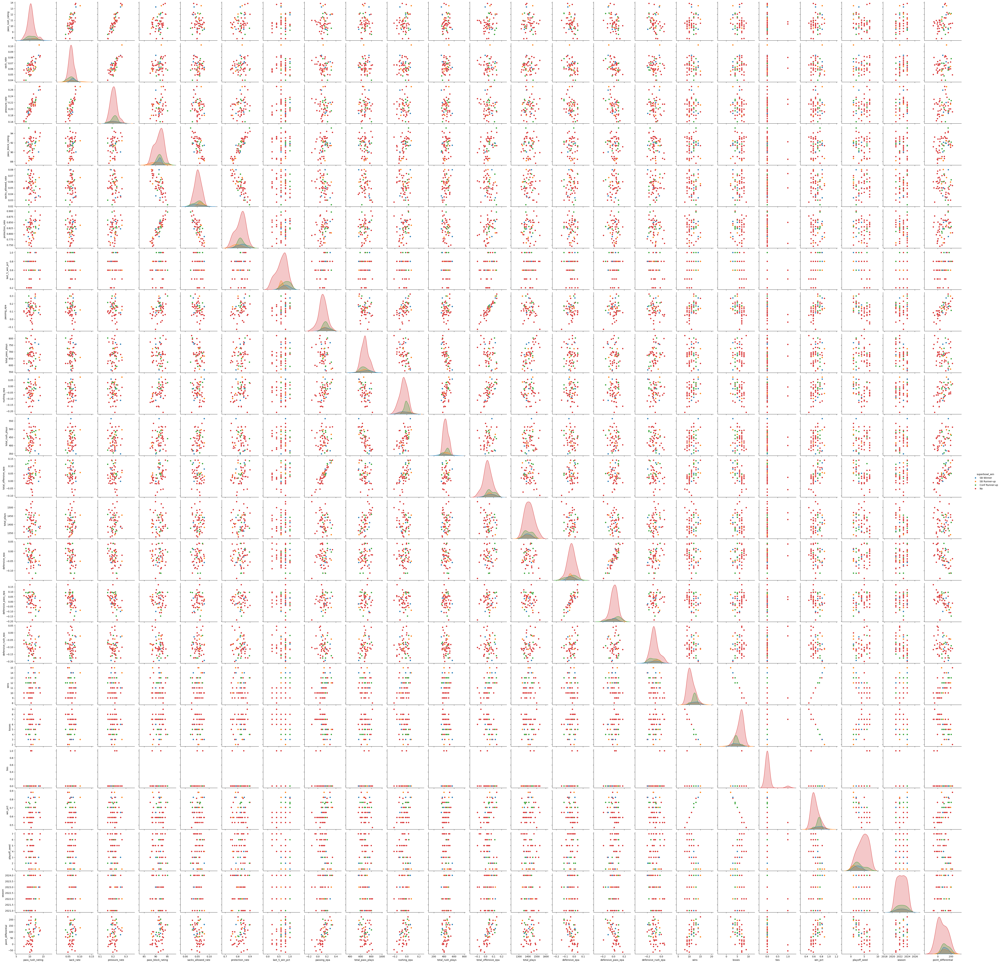

In [263]:
sns.pairplot(df_combined, hue='superbowl_win',
             hue_order=['SB Winner', 'SB Runner-up', 'Conf Runner-up', 'No'])

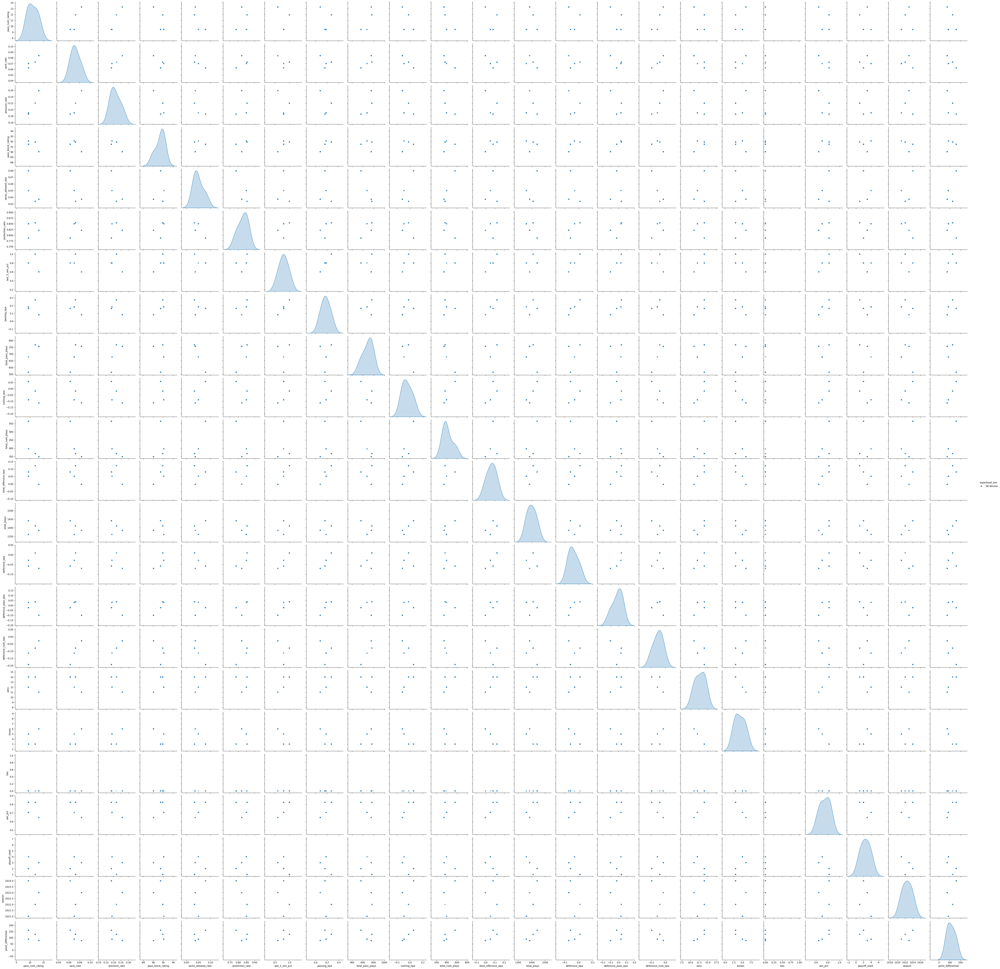

In [265]:
# Filter out teams that didn't make playoffs
df_filtered = df_combined[df_combined['superbowl_win'] != 'No']
df_filtered = df_combined[df_combined['superbowl_win'] != 'SB Runner-up']
df_filtered = df_combined[df_combined['superbowl_win'] != 'Conf Runner-up']
# Create pairplot with only playoff teams
sns.pairplot(df_filtered, hue='superbowl_win',
             hue_order=['SB Winner'])

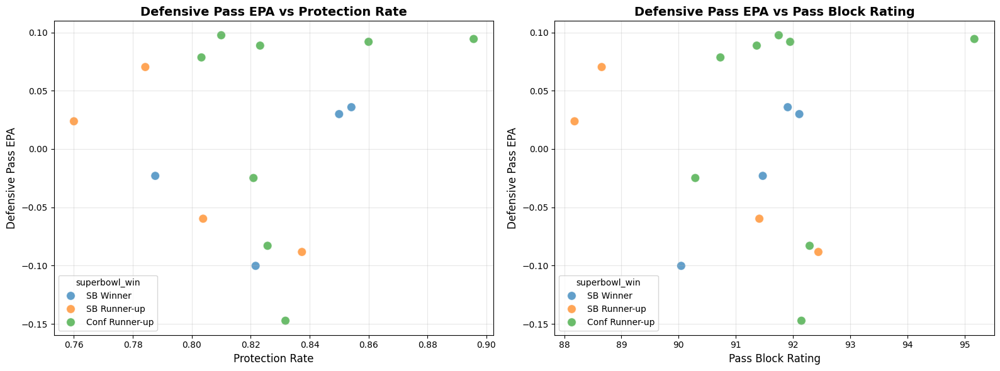

In [269]:
# Filter out "No" teams for cleaner visualization
df_filtered = df_combined[df_combined['superbowl_win'] != 'No']

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Defensive pass EPA vs Protection Rate
sns.scatterplot(data=df_filtered, 
                x='protection_rate', 
                y='defensive_pass_epa',
                hue='superbowl_win',
                hue_order=['SB Winner', 'SB Runner-up', 'Conf Runner-up'],
                s=100,  # marker size
                alpha=0.7,
                ax=axes[0])
axes[0].set_title('Defensive Pass EPA vs Protection Rate', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Protection Rate', fontsize=12)
axes[0].set_ylabel('Defensive Pass EPA', fontsize=12)
axes[0].grid(True, alpha=0.3)

# Plot 2: Defensive pass EPA vs Pass Block Rating
sns.scatterplot(data=df_filtered, 
                x='pass_block_rating', 
                y='defensive_pass_epa',
                hue='superbowl_win',
                hue_order=['SB Winner', 'SB Runner-up', 'Conf Runner-up'],
                s=100,
                alpha=0.7,
                ax=axes[1])
axes[1].set_title('Defensive Pass EPA vs Pass Block Rating', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Pass Block Rating', fontsize=12)
axes[1].set_ylabel('Defensive Pass EPA', fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

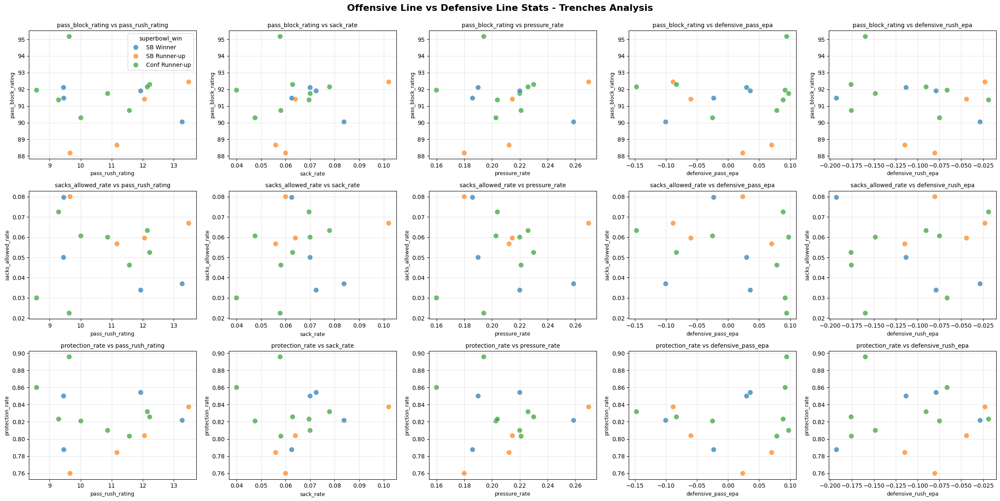

In [273]:


# Filter data
df_filtered = df_combined[df_combined['superbowl_win'] != 'No']

# Define defensive line and offensive line stats based on your actual columns
defensive_line_stats = ['pass_rush_rating', 'sack_rate', 'pressure_rate', 
                        'defensive_pass_epa', 'defensive_rush_epa']

offensive_line_stats = ['pass_block_rating', 'sacks_allowed_rate', 'protection_rate']

# Create a grid of subplots
n_def = len(defensive_line_stats)
n_off = len(offensive_line_stats)

fig, axes = plt.subplots(n_off, n_def, figsize=(24, 12))

# Create each combination
for i, off_stat in enumerate(offensive_line_stats):
    for j, def_stat in enumerate(defensive_line_stats):
        sns.scatterplot(data=df_filtered,
                       x=def_stat,
                       y=off_stat,
                       hue='superbowl_win',
                       hue_order=['SB Winner', 'SB Runner-up', 'Conf Runner-up'],
                       s=80,
                       alpha=0.7,
                       ax=axes[i, j],
                       legend=(i==0 and j==0))  # Only show legend on first plot
        
        axes[i, j].set_title(f'{off_stat} vs {def_stat}', fontsize=10)
        axes[i, j].grid(True, alpha=0.3)
        axes[i, j].set_xlabel(def_stat, fontsize=9)
        axes[i, j].set_ylabel(off_stat, fontsize=9)

plt.suptitle('Offensive Line vs Defensive Line Stats - Trenches Analysis', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()